<a href="https://colab.research.google.com/github/AhmadKElsayed/AirBNB/blob/main/CLIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
import torch
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel
from PIL import Image

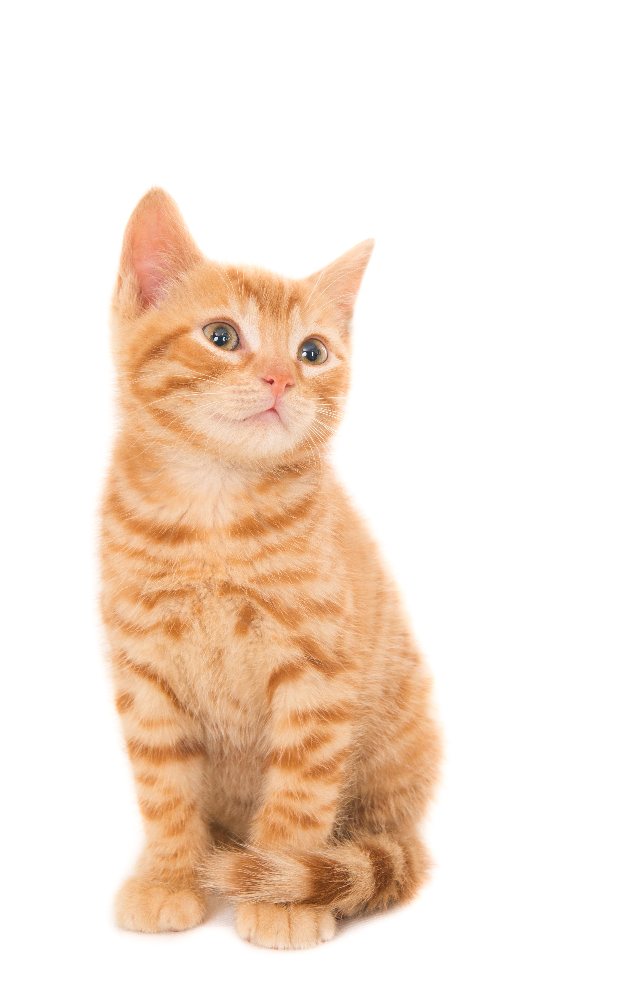

In [21]:
# Load an image
image = Image.open("cat.jpg")
display(image)

In [27]:
# Loading Model
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Prepare text and image
inputs = processor(text="a standing orange cat with white background", images=image, return_tensors="pt", padding=True)

# Get embeddings separately
with torch.no_grad():
    text_embeds = model.get_text_features(**{k: inputs[k] for k in ['input_ids', 'attention_mask']})
    image_embeds = model.get_image_features(pixel_values=inputs['pixel_values'])

print(text_embeds.shape)  # (1, 512)
print(image_embeds.shape) # (1, 512)


torch.Size([1, 512])
torch.Size([1, 512])


In [29]:
# Normalize both embeddings
text_embeds = F.normalize(text_embeds, p=2, dim=-1)
image_embeds = F.normalize(image_embeds, p=2, dim=-1)

# Compute cosine similarity
similarity = torch.matmul(text_embeds, image_embeds.T)
print("Cosine Similarity:", similarity.item())


Cosine Similarity: 0.31607499718666077
